Final Project Steps:

1. UX Design the App (excalidraw / Figma)
2. Introduction Page (Problem / Dataset)
3. Data Visulation (Python / Looker)
4. Prediction
5. Explanation
6. MLflow? Deployment
7. Conclusion

In [17]:
!curl ipecho.net/plain

34.148.10.123

In [20]:
!pip install streamlit --quiet
!pip install pyngrok --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 17.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 38.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.0 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive')

%cd '/content/drive/My Drive/Colab Notebooks/Data Science'

!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Colab Notebooks/Data Science
'Copy of 04 Datasets (Pandas) - Exercise 2 .ipynb'
'Copy of Linear_Regression_Exercise.ipynb'
'Copy of Pandas - Part II - course.ipynb'
'Copy of Session: 03 Python Operations (NumPy) - Exercise .ipynb'
'Data Science For Everyone.ipynb'
 final_transactions_dataset.csv
 GitStreamlit_app_visualization.ipynb
'OT_Logistic Regression Project.ipynb'
 SeaBorn.ipynb
 StreamlitOT_app_visualization.ipynb


In [38]:
from google.colab import drive
import pandas as pd

# Mount Google Drive
drive.mount('/content/drive', force_remount = True)

# Define the file path within the shared folder
shared_folder_path = "/content/drive/My Drive/Colab Notebooks/Data Science/"

# Concatenate the shared folder path with the file name
file_path = shared_folder_path + "final_transactions_dataset.csv"

# Read the CSV file
df = pd.read_csv(file_path)

Mounted at /content/drive


In [39]:
tech_df = df.loc[df['sector'] == 'TECH']
tech_df = tech_df.sample(n=10000)

In [40]:
tech_df.to_csv(file_path, index=False)

In [2]:
df.columns

Index(['Unnamed: 0', 'company', 'sector', 'horizon (days)', 'amount',
       'date_BUY_fix', 'date_SELL_fix', 'price_BUY', 'price_SELL',
       'Volatility_Buy', 'Volatility_sell', 'Sharpe Ratio',
       'expected_return (yearly)', 'inflation', 'nominal_return', 'investment',
       'ESG_ranking', 'PE_ratio', 'EPS_ratio', 'PS_ratio', 'PB_ratio',
       'NetProfitMargin_ratio', 'current_ratio', 'roa_ratio', 'roe_ratio'],
      dtype='object')

In [16]:
df.head()

,Unnamed: 0,company,sector,horizon (days),amount,date_BUY_fix,date_SELL_fix,price_BUY,price_SELL,Volatility_Buy,...,ESG_ranking,PE_ratio,EPS_ratio,PS_ratio,PB_ratio,NetProfitMargin_ratio,current_ratio,roa_ratio,roe_ratio,Horizon (months)
0,0,BBY,RETAIL,2,100,2017-05-25,2017-05-26,55.551804,53.483913,0.383666,...,12.0,12.58,3.73,0.38,3.19,3.01,1.49,8.69,26.69,0
1,1,BAC,BANK,330,15000,2016-11-22,2017-10-18,18.616749,24.654472,0.322809,...,26.3,11.39,1.26,1.71,0.54,15.70,0.92,0.67,5.54,11
2,2,AXP,BANK,7,3000,2016-09-27,2016-10-04,59.862297,59.517727,0.238642,...,19.8,10.58,5.64,1.67,2.60,15.68,1.91,3.39,25.78,0
3,3,KSS,RETAIL,5,20000,2016-10-11,2016-10-17,38.216724,35.985329,0.428559,...,12.9,11.09,3.27,0.36,1.25,3.17,1.60,4.41,11.35,0
4,4,JPM,BANK,360,15000,2015-03-12,2016-03-07,51.869335,52.047966,0.194612,...,27.9,9.38,5.46,1.87,0.81,19.91,0.99,0.81,8.91,12


In [12]:
df['Horizon (months)'] = df['horizon (days)'] // 30
df['Horizon (months)']

0          0
1         11
2          0
3          0
4         12
          ..
405253    16
405254    10
405255     7
405256     9
405257     0
Name: Horizon (months), Length: 405258, dtype: int64

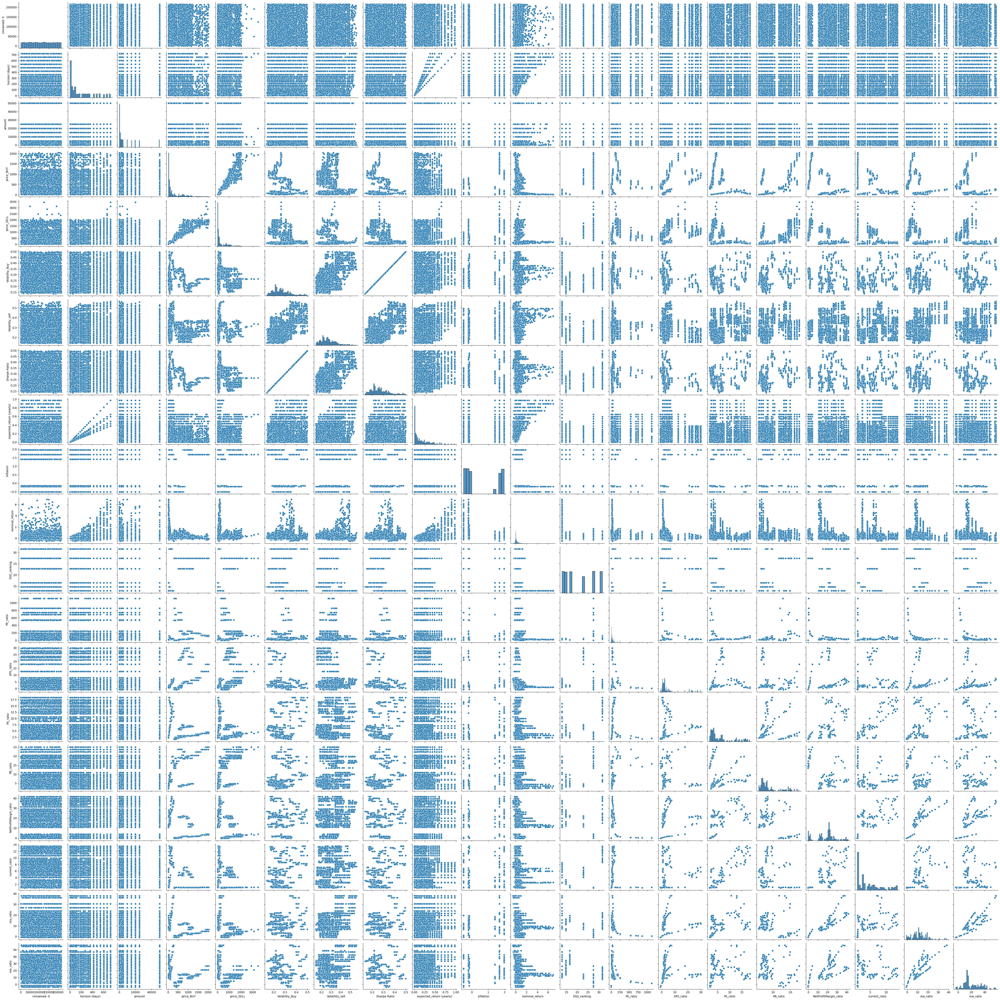

In [ ]:
import streamlit as st
import pandas as pd
import numpy as np
import seaborn as sns
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics

df = pd.read_csv("final_transactions_dataset.csv")
tech_df = df.loc[df['sector'] == 'TECH']
tech_df = tech_df.sample(n=10000)
sns.pairplot(tech_df)

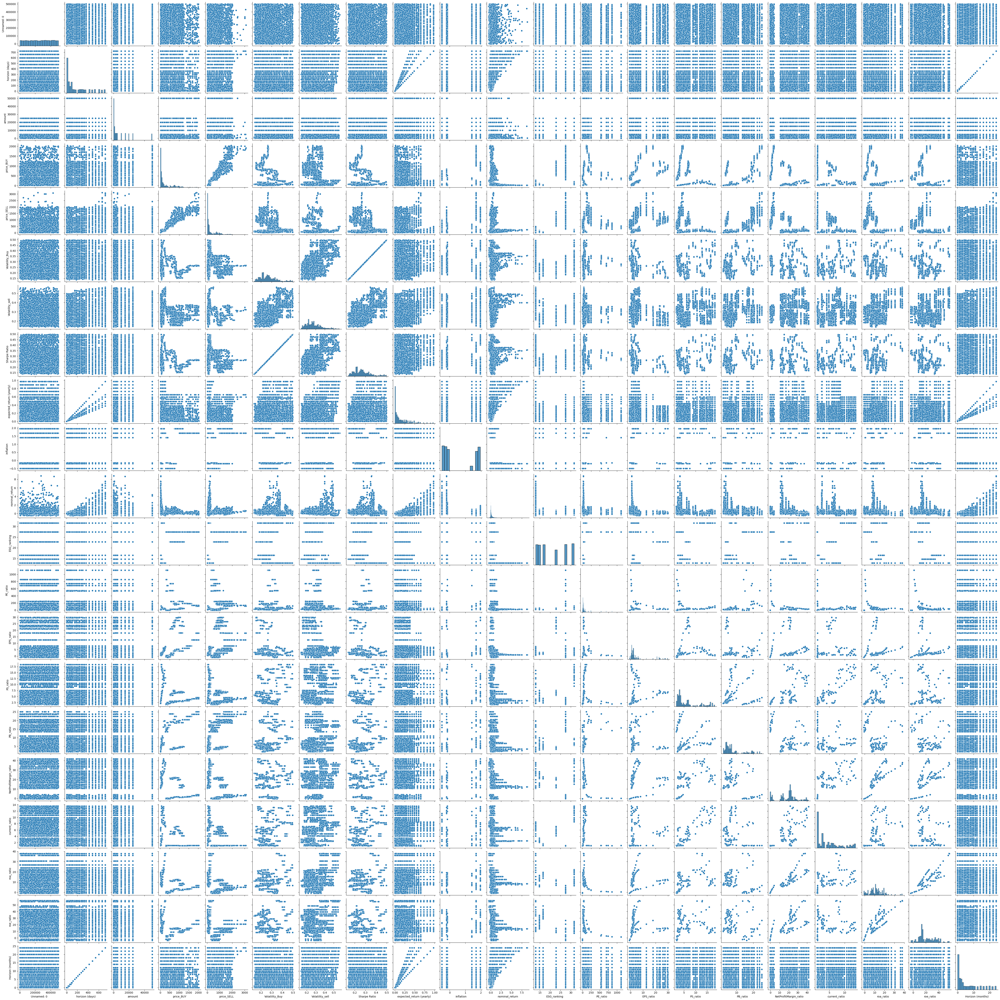

In [15]:
import seaborn as sns
tech_df = df.loc[df['sector'] == 'TECH']
tech_df = tech_df.sample(n=10000)
sns.pairplot(tech_df)

<Axes: ylabel='horizon (days)'>

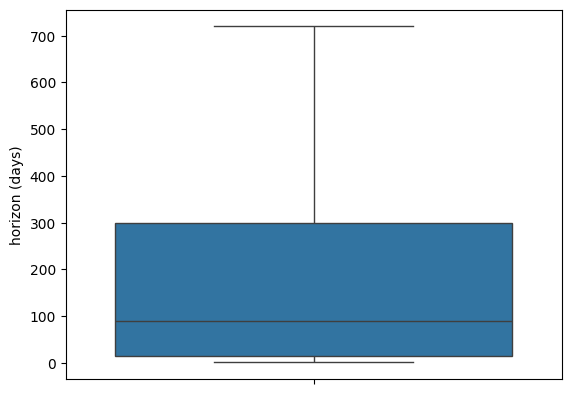

In [24]:
sns.boxplot(tech_df['horizon (days)'])

In [28]:
tech_df['horizon (days)']

70866     120
226171    720
339759    420
172611    100
344996     60
         ... 
55984     240
63103     330
260518    480
111185      1
215968    600
Name: horizon (days), Length: 10000, dtype: int64

<Axes: ylabel='horizon (days)'>

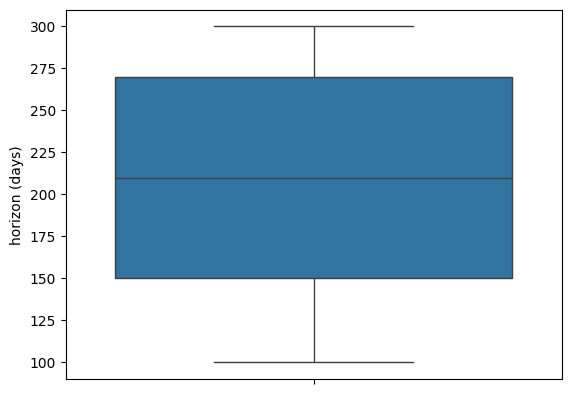

In [33]:
top_df = tech_df[(tech_df['horizon (days)'] >= 100) & (tech_df['horizon (days)'] <= 300)]
sns.boxplot(top_df['horizon (days)'])

In [35]:
%%capture
!pip install mlflow
!pip install pyngrok

In [36]:
!killall ngrok

ngrok: no process found


In [37]:
import mlflow
import mlflow.sklearn
import subprocess
from pyngrok import ngrok, conf
import getpass

import numpy as np
import pandas as pd
#from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
#from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import mlflow
import mlflow.sklearn

MLFLOW_TRACKING_URI = "sqlite:///mlflow.db"
subprocess.Popen(["mlflow", "ui", "--backend-store-uri", MLFLOW_TRACKING_URI])
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
# mlflow will create an experiment if it doesn't exist
mlflow.set_experiment("sklearn2")
print("Enter your authtoken, which can be copied from https://dashboard.ngrok.com/auth")
conf.get_default().auth_token = getpass.getpass()
port=5000
public_url = ngrok.connect(port).public_url
print(f' * ngrok tunnel \"{public_url}\" -> \"http://127.0.0.1:{port}\"')

2024/04/22 14:12:27 INFO mlflow.store.db.utils: Creating initial MLflow database tables...
2024/04/22 14:12:27 INFO mlflow.store.db.utils: Updating database tables
INFO  [alembic.runtime.migration] Context impl SQLiteImpl.
INFO  [alembic.runtime.migration] Will assume non-transactional DDL.
INFO  [alembic.runtime.migration] Running upgrade  -> 451aebb31d03, add metric step
INFO  [alembic.runtime.migration] Running upgrade 451aebb31d03 -> 90e64c465722, migrate user column to tags
INFO  [alembic.runtime.migration] Running upgrade 90e64c465722 -> 181f10493468, allow nulls for metric values
INFO  [alembic.runtime.migration] Running upgrade 181f10493468 -> df50e92ffc5e, Add Experiment Tags Table
INFO  [alembic.runtime.migration] Running upgrade df50e92ffc5e -> 7ac759974ad8, Update run tags with larger limit
INFO  [alembic.runtime.migration] Running upgrade 7ac759974ad8 -> 89d4b8295536, create latest metrics table
INFO  [89d4b8295536_create_latest_metrics_table_py] Migration complete!
INFO  

Enter your authtoken, which can be copied from https://dashboard.ngrok.com/auth


KeyboardInterrupt: Interrupted by user

In [22]:
import streamlit as st
import pandas as pd
import numpy as np
import seaborn as sns
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics


st.sidebar.header("Dashboard")
st.sidebar.markdown("---")
app_mode = st.sidebar.selectbox('Select Page',['Introduction','Visualization','Prediction'])

df = pd.read_csv("final_transactions_dataset.csv")



if app_mode == "Introduction":

  st.title("Introduction")
  st.markdown("### Welcome to our ESG rankings Dashboard!")

  #st.image("veh.jpeg", use_column_width=True)

  st.markdown("#### Wondering what is ESG rankings relative to Investments")
  st.markdown("Our company is a Health insurance company who is looking to improve their revenue model by expanding into a new sector: Vehicle Insurance.")
  st.markdown("##### Objectives")
  st.markdown("- Using other variables that contribute to investment over the years")
  st.markdown("- Points that can be made: ESG growth over the years; correlation w Investment & social pressures")
  st.markdown("- Does an increase ESG lead to increase in Investment? ")

  num = st.number_input('No. of Rows', 5, 10)

  head = st.radio('View from top (head) or bottom (tail)', ('Head', 'Tail'))
  if head == 'Head':
    st.dataframe(df.head(num))
  else:
    st.dataframe(df.tail(num))

  st.text('(Rows,Columns)')
  st.write(df.shape)

  st.markdown("##### Key Variables")

  st.dataframe(df.describe())

  st.markdown("### Missing Values")
  st.markdown("Null or NaN values.")

  dfnull = df.isnull().sum()/len(df)*100
  totalmiss = dfnull.sum().round(2)
  st.write("Percentage of total missing values:",totalmiss)
  st.write(dfnull)
  if totalmiss <= 30:
    st.success("We have less then 30 percent of missing values, which is good. This provides us with more accurate data as the null values will not significantly affect the outcomes of our conclusions. And no bias will steer towards misleading results. ")
  else:
    st.warning("Poor data quality due to greater than 30 percent of missing value.")
    st.markdown(" > Theoretically, 25 to 30 percent is the maximum missing values are allowed, there's no hard and fast rule to decide this threshold. It can vary from problem to problem.")

  st.markdown("### Completeness")
  st.markdown(" The ratio of non-missing values to total records in dataset and how comprehensive the data is.")

  st.write("Total data length:", len(df))
  nonmissing = (df.notnull().sum().round(2))
  completeness= round(sum(nonmissing)/len(df),2)

  st.write("Completeness ratio:",completeness)
  st.write(nonmissing)
  if completeness >= 0.80:
    st.success("We have completeness ratio greater than 0.85, which is good. It shows that the vast majority of the data is available for us to use and analyze. ")
  else:
    st.success("Poor data quality due to low completeness ratio( less than 0.85).")

elif app_mode == "Visualization":
  st.title("Visualization")
  tech_df = df.loc[df['sector'] == 'TECH']



  # DATA VISUALISATION
  tab1, tab2, tab3, tab4 = st.tabs(["SNS Plot", "Bar Chart", "Line Chart", "Pie Plot"])

  #SNS plot
  tab1.subheader("SNS plot")
  tech_df = tech_df.sample(n=10000)
  fig = sns.pairplot(tech_df)
  tab1.pyplot(fig)

  #Bar Graph
  # User input for x-variable
  columns = ['Region_Code', 'Gender', 'Vehicle_Age']
  x_variable = tab2.selectbox("Select x-variable:", columns)
  tab2.subheader(f"{x_variable} vs Price (INR)")
  #data_by_variable = df.groupby(x_variable)['Annual_Premium'].mean()
  #tab2.bar_chart(data_by_variable)

  #Line Graph
  tab3.subheader("Age vs Price")
  #age_by_price = df.groupby('Age')['Annual_Premium'].mean()
  #tab3.line_chart(age_by_price)

  '''
  tab4.subheader("Pie plot")
  tab4.subheader("Response distribution by Vehicle Damage")
  response_counts = df.groupby(['Vehicle_Damage', 'Response']).size().unstack(fill_value=0)
  fig, ax = plt.subplots()
  colors = ['#ff9999','#66b3ff']
  damage_counts = response_counts.loc[1]
  percentages = (damage_counts.values / damage_counts.sum()) * 100
  labels = ['Yes', 'No']
  ax.pie(percentages, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
  ax.axis('equal')
  tab4.pyplot(fig)

  #Pie Plot2
  tab4.subheader("Response Distribution by Not Previously Insured")
  response_counts = df.groupby(['Previously_Insured', 'Response']).size().unstack(fill_value=0)
  fig, ax = plt.subplots()
  colors = ['#ff9999','#66b3ff']
  prev_insurance_counts = response_counts.loc[0]
  percentages = (prev_insurance_counts.values / prev_insurance_counts.sum()) * 100
  labels = ['Yes', 'No']
  ax.pie(percentages, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
  ax.axis('equal')
  tab4.pyplot(fig)


  tab1, tab2, tab3, tab4 = st.tabs(["SNS Plot", "Bar Chart", "Line Chart", "Pie Plot"])

  fig = sns.pairplot(df)
  tab1.pyplot(fig)
  '''

elif app_mode == "Prediction":
  st.markdown("Prediction")

  '''
  # Changing "Yes" and "No" to 1 and 0
  df.loc[df['Vehicle_Damage'] == "Yes", 'Vehicle_Damage'] = 1
  df.loc[df['Vehicle_Damage'] == "No", 'Vehicle_Damage'] = 0
  st.title("Prediction")
  X = df[['Age', 'Region_Code', 'Driving_License','Vehicle_Damage', 'Previously_Insured']]
  y = df['Annual_Premium']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
  lin_reg = LinearRegression()
  lin_reg.fit(X_train,y_train)
  pred = lin_reg.predict(X_test)

  plt.figure(figsize=(10,7))
  plt.title("Actual vs. predicted Annual Premiums",fontsize=25)
  plt.xlabel("Actual test set Annual Premiums",fontsize=18)
  plt.ylabel("Predicted Annual Premiums", fontsize=18)
  plt.scatter(x=y_test,y=pred)
  plt.savefig('prediction.png')
  st.image('prediction.png')

  # Model Evaluation
  st.markdown("Evaluation")
  coeff_df = pd.DataFrame(lin_reg.coef_, X.columns, columns=['Coefficient'])
  st.dataframe(coeff_df)
  MAE = metrics.mean_absolute_error(y_test, pred)
  MSE = metrics.mean_squared_error(y_test, pred)
  RMSE = np.sqrt(metrics.mean_squared_error(y_test, pred))
  st.write('MAE:', MAE)
  st.write('MSE:', MSE)
  st.write('RMSE:', RMSE)
  '''

In [23]:
!streamlit run app.py & npx localtunnel --port 8501

Usage: streamlit run [OPTIONS] TARGET [ARGS]...
Try 'streamlit run --help' for help.

Error: Invalid value: File does not exist: app.py
npx: installed 22 in 5.048s
your url is: https://smooth-camels-make.loca.lt
^C
